In [71]:
# import libraries
import sys, os

# # Add the src directory to sys.path
# src_path = os.path.join(os.path.dirname(__file__), 'src')
# sys.path.append(src_path)

import numpy as np
import pandas as pd
import shelve
import importlib
from src.neuron import *
from src.utils import *
from src.constants import * 
from src.network import *
from src.validation import *
from src.viz import *
from src.genetic_algorithm import *
from copy import copy
from datetime import datetime
from IPython.display import display, HTML

file_path = '/Users/stevenwendel/Documents/GitHub/bg/data/highMutation_480min_2025-02-06_01-21-20.pkl'


In [72]:
# Pull data from df into ga_results dictionary

def pickle_to_dataframe(path):
    # Collect data in a list
    ga_raw = pickle.load(open(path, 'rb'))
    data = []
    
    for gen, runs in ga_raw.items():
        for run in runs:
            data.append([gen, run['dna'], run['dna_score']])
            
    # Create DataFrame in one go
    df = pd.DataFrame(data, columns=['generation', 'dna', 'dna_score'])

    # Sort the DataFrame (not the transposed version)
    ga_results = df.sort_values(by='dna_score', ascending=False, ignore_index=True)
    return ga_results

ga_results=pickle_to_dataframe(file_path)
display(ga_results)

,generation,dna,dna_score
0,149,"[834, 0, 0, 1000, -7, -10, 0, 0, -20, 24, 0, 0...",984
1,149,"[900, 0, 0, 942, -13, 0, 0, 0, -14, 80, 0, 0, ...",983
2,149,"[520, 0, 0, 452, -32, -153, 10, 0, -46, 75, 0,...",983
3,147,"[520, 0, 0, 452, -32, -153, 10, 0, -46, 75, 0,...",983
4,146,"[520, 0, 0, 452, -32, -153, 10, 0, -46, 75, 0,...",983
...,...,...,...
599995,0,"[100, 652, 959, 226, -175, -543, -680, -236, -...",397
599996,24,"[91, -180, 4, 570, -50, -725, 15, -29, -93, -5...",395
599997,33,"[71, 0, -1, 586, -53, -231, 0, -32, 0, -145, -...",381
599998,25,"[247, -768, 0, 658, -28, -362, 98, -329, -210,...",350


In [73]:

data_folder = "/Users/stevenwendel/Documents/GitHub/bg/data"

file_dataframes = {}

for filename in os.listdir(data_folder):
    print(filename)
    if filename.endswith('.pkl'):
        path = os.path.join(data_folder, filename)
        ga_results = pickle_to_dataframe(path)
    
    best_run = ga_results.iloc[0]

    # Create a labeled Series for the best run's DNA
    best_run_labeled = pd.Series(best_run['dna'], index=[f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES])
    print(*best_run)
    display(best_run_labeled)

archive
149 [834, 0, 0, 1000, -7, -10, 0, 0, -20, 24, 0, 0, -4, 0, 0, 0, 104, 0, -365, 82, 0, 0, 0, 0, 172, 645, 0, 0, 0, 0, 0, -78, 55, 0, 0, 0, 0, -175, 0, 0, 0, 0, -570, 0, 0, 0, 36, 414, 0] 984


Somat -> ALMprep        834
Somat -> ALMinter         0
Somat -> ALMresp          0
Somat -> MSN1          1000
MSN1 -> SNR1             -7
MSN1 -> SNR2            -10
MSN1 -> SNR3              0
MSN2 -> SNR1              0
MSN2 -> SNR2            -20
MSN2 -> SNR3             24
MSN3 -> SNR1              0
MSN3 -> SNR2              0
MSN3 -> SNR3             -4
SNR1 -> VMprep            0
SNR1 -> VMresp            0
SNR2 -> VMprep            0
SNR2 -> VMresp          104
SNR3 -> VMprep            0
SNR3 -> VMresp         -365
VMprep -> ALMprep        82
VMprep -> ALMinter        0
VMprep -> ALMresp         0
VMresp -> ALMprep         0
VMresp -> ALMinter        0
VMresp -> ALMresp       172
ALMprep -> MSN2         645
ALMinter -> MSN1          0
ALMinter -> MSN2          0
ALMinter -> MSN3          0
ALMresp -> MSN1           0
ALMresp -> MSN2           0
ALMresp -> MSN3         -78
ALMprep -> VMprep        55
ALMresp -> VMresp         0
MSN1 -> MSN2              0
MSN1 -> MSN3        

highMutation_120 min_2025-02-06_12-55-55.pkl
94 [894, -27, -173, 1000, -7, -85, 0, 0, -22, 0, -132, 0, 0, 0, 0, 0, -131, 0, 0, 23, 0, 0, 0, 0, 0, 148, 0, 0, 0, -67, 19, 0, 333, 67, 0, 0, 0, 0, 9, 0, 0, 0, -447, 0, 62, 425, 40, 307, 0] 943


Somat -> ALMprep        894
Somat -> ALMinter       -27
Somat -> ALMresp       -173
Somat -> MSN1          1000
MSN1 -> SNR1             -7
MSN1 -> SNR2            -85
MSN1 -> SNR3              0
MSN2 -> SNR1              0
MSN2 -> SNR2            -22
MSN2 -> SNR3              0
MSN3 -> SNR1           -132
MSN3 -> SNR2              0
MSN3 -> SNR3              0
SNR1 -> VMprep            0
SNR1 -> VMresp            0
SNR2 -> VMprep            0
SNR2 -> VMresp         -131
SNR3 -> VMprep            0
SNR3 -> VMresp            0
VMprep -> ALMprep        23
VMprep -> ALMinter        0
VMprep -> ALMresp         0
VMresp -> ALMprep         0
VMresp -> ALMinter        0
VMresp -> ALMresp         0
ALMprep -> MSN2         148
ALMinter -> MSN1          0
ALMinter -> MSN2          0
ALMinter -> MSN3          0
ALMresp -> MSN1         -67
ALMresp -> MSN2          19
ALMresp -> MSN3           0
ALMprep -> VMprep       333
ALMresp -> VMresp        67
MSN1 -> MSN2              0
MSN1 -> MSN3        

highMutation_480min_2025-02-06_01-21-20.pkl
149 [834, 0, 0, 1000, -7, -10, 0, 0, -20, 24, 0, 0, -4, 0, 0, 0, 104, 0, -365, 82, 0, 0, 0, 0, 172, 645, 0, 0, 0, 0, 0, -78, 55, 0, 0, 0, 0, -175, 0, 0, 0, 0, -570, 0, 0, 0, 36, 414, 0] 984


Somat -> ALMprep        834
Somat -> ALMinter         0
Somat -> ALMresp          0
Somat -> MSN1          1000
MSN1 -> SNR1             -7
MSN1 -> SNR2            -10
MSN1 -> SNR3              0
MSN2 -> SNR1              0
MSN2 -> SNR2            -20
MSN2 -> SNR3             24
MSN3 -> SNR1              0
MSN3 -> SNR2              0
MSN3 -> SNR3             -4
SNR1 -> VMprep            0
SNR1 -> VMresp            0
SNR2 -> VMprep            0
SNR2 -> VMresp          104
SNR3 -> VMprep            0
SNR3 -> VMresp         -365
VMprep -> ALMprep        82
VMprep -> ALMinter        0
VMprep -> ALMresp         0
VMresp -> ALMprep         0
VMresp -> ALMinter        0
VMresp -> ALMresp       172
ALMprep -> MSN2         645
ALMinter -> MSN1          0
ALMinter -> MSN2          0
ALMinter -> MSN3          0
ALMresp -> MSN1           0
ALMresp -> MSN2           0
ALMresp -> MSN3         -78
ALMprep -> VMprep        55
ALMresp -> VMresp         0
MSN1 -> MSN2              0
MSN1 -> MSN3        

highMutation_3hr_2025-02-05_12-52-43.pkl
generation149 [11320, 0, 0, 1058, -11, -10, 0, 0, -33, 0, 0, 0, -13, 0, 0, 0, 279, 0, -244, 83, 0, 0, 0, 1, 2563, 102, 0, -68, 0, 0, 0, 187, 68, 0, 0, 0, 0, 0, -1, 0, 0, 0, -112, 0, 0, 0, 40, 422, 0] 974


Somat -> ALMprep       11320
Somat -> ALMinter          0
Somat -> ALMresp           0
Somat -> MSN1           1058
MSN1 -> SNR1             -11
MSN1 -> SNR2             -10
MSN1 -> SNR3               0
MSN2 -> SNR1               0
MSN2 -> SNR2             -33
MSN2 -> SNR3               0
MSN3 -> SNR1               0
MSN3 -> SNR2               0
MSN3 -> SNR3             -13
SNR1 -> VMprep             0
SNR1 -> VMresp             0
SNR2 -> VMprep             0
SNR2 -> VMresp           279
SNR3 -> VMprep             0
SNR3 -> VMresp          -244
VMprep -> ALMprep         83
VMprep -> ALMinter         0
VMprep -> ALMresp          0
VMresp -> ALMprep          0
VMresp -> ALMinter         1
VMresp -> ALMresp       2563
ALMprep -> MSN2          102
ALMinter -> MSN1           0
ALMinter -> MSN2         -68
ALMinter -> MSN3           0
ALMresp -> MSN1            0
ALMresp -> MSN2            0
ALMresp -> MSN3          187
ALMprep -> VMprep         68
ALMresp -> VMresp          0
MSN1 -> MSN2  

highMutation_12hr_2025-02-05_06-41-53.pkl
generation75 [2829, 0, 0, 623, -12, -52, 0, 0, -42, 0, -10, 0, -197, -84, -10, 0, -95, 0, -266, 67, 0, 0, -11, 0, 10, 368, 0, -13, -17, 39, 673, -10, 95, 0, -5, 0, 0, 0, -5, 0, 0, -348, -401, -299, 0, 0, 33, 562, 0] 946


Somat -> ALMprep       2829
Somat -> ALMinter         0
Somat -> ALMresp          0
Somat -> MSN1           623
MSN1 -> SNR1            -12
MSN1 -> SNR2            -52
MSN1 -> SNR3              0
MSN2 -> SNR1              0
MSN2 -> SNR2            -42
MSN2 -> SNR3              0
MSN3 -> SNR1            -10
MSN3 -> SNR2              0
MSN3 -> SNR3           -197
SNR1 -> VMprep          -84
SNR1 -> VMresp          -10
SNR2 -> VMprep            0
SNR2 -> VMresp          -95
SNR3 -> VMprep            0
SNR3 -> VMresp         -266
VMprep -> ALMprep        67
VMprep -> ALMinter        0
VMprep -> ALMresp         0
VMresp -> ALMprep       -11
VMresp -> ALMinter        0
VMresp -> ALMresp        10
ALMprep -> MSN2         368
ALMinter -> MSN1          0
ALMinter -> MSN2        -13
ALMinter -> MSN3        -17
ALMresp -> MSN1          39
ALMresp -> MSN2         673
ALMresp -> MSN3         -10
ALMprep -> VMprep        95
ALMresp -> VMresp         0
MSN1 -> MSN2             -5
MSN1 -> MSN3        

highMutation_12hr_2025-02-05_00-15-38.pkl
generation75 [856, -3, 5, 569, -264, -53, 0, -796, 0, -636, -53, -141, 0, 0, -6, -7, -231, -2, -139, 67, 0, -38, 0, 1225, 0, 0, 0, 0, 7, 17, 195, 0, 405, 675, -150, -82, -31, -10, -381, -3, 0, 0, -219, -1093, 13, 137, 35, 1241, 3] 953


Somat -> ALMprep        856
Somat -> ALMinter        -3
Somat -> ALMresp          5
Somat -> MSN1           569
MSN1 -> SNR1           -264
MSN1 -> SNR2            -53
MSN1 -> SNR3              0
MSN2 -> SNR1           -796
MSN2 -> SNR2              0
MSN2 -> SNR3           -636
MSN3 -> SNR1            -53
MSN3 -> SNR2           -141
MSN3 -> SNR3              0
SNR1 -> VMprep            0
SNR1 -> VMresp           -6
SNR2 -> VMprep           -7
SNR2 -> VMresp         -231
SNR3 -> VMprep           -2
SNR3 -> VMresp         -139
VMprep -> ALMprep        67
VMprep -> ALMinter        0
VMprep -> ALMresp       -38
VMresp -> ALMprep         0
VMresp -> ALMinter     1225
VMresp -> ALMresp         0
ALMprep -> MSN2           0
ALMinter -> MSN1          0
ALMinter -> MSN2          0
ALMinter -> MSN3          7
ALMresp -> MSN1          17
ALMresp -> MSN2         195
ALMresp -> MSN3           0
ALMprep -> VMprep       405
ALMresp -> VMresp       675
MSN1 -> MSN2           -150
MSN1 -> MSN3        

In [74]:
# Get best_run from ga_results
for ga_results in file_dataframes:
    print(ga_results)
    best_run = ga_results.iloc[0]

    # Create a labeled Series for the best run's DNA
    best_run_labeled = pd.Series(best_run['dna'], index=[f"{pair[0]} -> {pair[1]}" for pair in ACTIVE_SYNAPSES])
    display(best_run_labeled)
    len(best_run_labeled)

In [39]:
#@title Tool to print curr_dna voltage history - OLD JH WEIGHTS

# Choose DNA
old_jh_dna = create_dna_string(old_jh_weights, ACTIVE_SYNAPSES)
old_padded_50 = create_dna_string(old_padded_dna_0, ACTIVE_SYNAPSES)
new_jh_dna = create_dna_string(new_jh_weights, ACTIVE_SYNAPSES)
best_run_GA = best_run['dna']
second_best_run_GA = ga_results.iloc[1]['dna']
third_best_run_GA = ga_results.iloc[2]['dna']

curr_dna = best_run_GA

# Load DNA
dna_matrix = load_dna(curr_dna)


# === Preparing Network === 
all_neurons = create_neurons()
splits, input_waves, alpha_array = create_experiment()
criteria_dict = define_criteria()
max_score = TMAX//BIN_SIZE * len(CRITERIA_NAMES)

dna_score, neuron_data = evaluate_dna(
                dna_matrix=dna_matrix,
                neurons=all_neurons,
                alpha_array=alpha_array,
                input_waves=input_waves,
                criteria=criteria_dict,
                curr_dna=curr_dna
                )
total_score = sum(dna_score.values())
print(f'    === DNA: {curr_dna}') 
print(f'    === Control: {dna_score["control"]}/{max_score}')
print(f'    === Experimental: {dna_score["experimental"]}/{max_score}')
print(f'    === Overall: {total_score}({total_score/(2*max_score):.2%})')
print('\n')
"""
neuron_data = {
    'experimental': {
        'neuron_name': {
            'hist_V': np.array(),
            'spike_times': np.array()
        },
    'control': {
        'neuron_name': {
            'hist_V': np.array(),
            'spike_times': np.array()
        }
    }
}
"""

diagnostic = {
        'show_dna_matrix' : True,
        'show_neuron_plots' : True,
        'show_difference_histogram' : False,
        'show_dna_scores': True
    }


if diagnostic['show_dna_matrix']:
                print("Currently loaded matrix ---")
                display_matrix(dna_matrix, NEURON_NAMES)

if diagnostic['show_dna_scores']:
                print(f'{dna_score=}: {curr_dna}')
            
if diagnostic['show_neuron_plots']:
                for condition in ['experimental', 'control']:
                    target_neurons_hist_Vs = np.array([neuron_data[condition][name]['hist_V'] for name in NEURON_NAMES])
                    plot_neurons_interactive(hist_Vs=target_neurons_hist_Vs, neuron_names=NEURON_NAMES, sq_wave=input_waves[0], go_wave=input_waves[1], show_u=False)
                    
if diagnostic['show_difference_histogram']:
                plot_binned_differences(binned_differences)


    === DNA: [834, 0, 0, 1000, -7, -10, 0, 0, -20, 24, 0, 0, -4, 0, 0, 0, 104, 0, -365, 82, 0, 0, 0, 0, 172, 645, 0, 0, 0, 0, 0, -78, 55, 0, 0, 0, 0, -175, 0, 0, 0, 0, -570, 0, 0, 0, 36, 414, 0]
    === Control: 500/500
    === Experimental: 484/500
    === Overall: 984(98.40%)


Currently loaded matrix ---


,Somat,MSN1,SNR1,VMprep,ALMprep,MSN2,SNR2,PPN,THALgo,ALMinter,MSN3,SNR3,ALMresp,VMresp
Somat,0.0,1000.0,0.0,0.0,834.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MSN1,0.0,0.0,-7.0,0.0,0.0,0.0,-10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SNR1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
VMprep,0.0,0.0,0.0,0.0,82.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ALMprep,0.0,0.0,0.0,55.0,0.0,645.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MSN2,0.0,0.0,0.0,0.0,0.0,0.0,-20.0,0.0,0.0,0.0,-175.0,24.0,0.0,0.0
SNR2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,104.0
PPN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,36.0,0.0,0.0,0.0,0.0,0.0
THALgo,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,414.0,0.0,0.0,0.0,0.0
ALMinter,0.0,0.0,0.0,0.0,-570.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


dna_score={'experimental': 484, 'control': 500}: [834, 0, 0, 1000, -7, -10, 0, 0, -20, 24, 0, 0, -4, 0, 0, 0, 104, 0, -365, 82, 0, 0, 0, 0, 172, 645, 0, 0, 0, 0, 0, -78, 55, 0, 0, 0, 0, -175, 0, 0, 0, 0, -570, 0, 0, 0, 36, 414, 0]
hist_Vs=array([[-60.        , -60.        , -60.        , ..., -60.        ,
        -60.        , -60.        ],
       [-80.        , -78.6       , -78.7008    , ..., -77.87042631,
        -77.87042631, -77.8704263 ],
       [-60.        , -58.8       , -57.75792   , ..., -51.35845705,
        -51.24843555, -51.12314992],
       ...,
       [-60.        , -58.8       , -57.75792   , ..., -63.01443358,
        -63.01592301, -63.01443358],
       [-60.        , -60.        , -60.        , ..., -34.94340062,
        -31.60042729, -27.44154846],
       [-60.        , -60.        , -60.        , ..., -49.68649977,
        -49.16134636, -48.60434043]])
neuron_names=['Somat', 'MSN1', 'SNR1', 'VMprep', 'ALMprep', 'MSN2', 'SNR2', 'PPN', 'THALgo', 'ALMinter', 'MSN3',

hist_Vs=array([[-60.        , -60.        , -60.        , ..., -60.        ,
        -60.        , -60.        ],
       [-80.        , -78.6       , -78.7008    , ..., -77.87042615,
        -77.87042615, -77.87042615],
       [-60.        , -58.8       , -57.75792   , ..., -50.37370542,
        -50.18135139, -49.97471025],
       ...,
       [-60.        , -58.8       , -57.75792   , ..., -50.37370542,
        -50.18135139, -49.97471025],
       [-60.        , -60.        , -60.        , ..., -60.        ,
        -60.        , -60.        ],
       [-60.        , -60.        , -60.        , ..., -77.46884371,
        -77.44286856, -77.40968947]])
neuron_names=['Somat', 'MSN1', 'SNR1', 'VMprep', 'ALMprep', 'MSN2', 'SNR2', 'PPN', 'THALgo', 'ALMinter', 'MSN3', 'SNR3', 'ALMresp', 'VMresp']


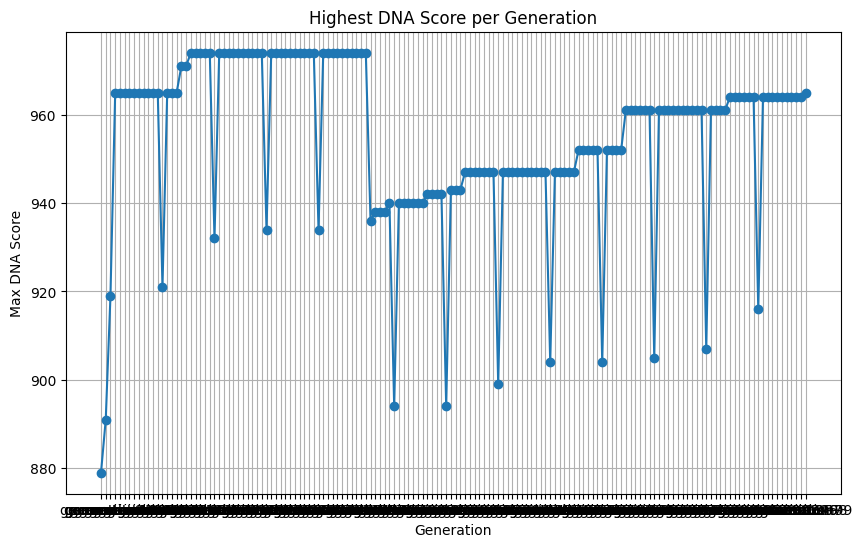

In [34]:
import matplotlib.pyplot as plt

# Extract the highest score from each generation
max_scores = ga_results.groupby('generation')['dna_score'].max().reset_index()

# Plot the highest scores over generations
plt.figure(figsize=(10, 6))
plt.plot(max_scores['generation'], max_scores['dna_score'], marker='o')
plt.title('Highest DNA Score per Generation')
plt.xlabel('Generation')
plt.ylabel('Max DNA Score')
plt.grid(True)
plt.show()


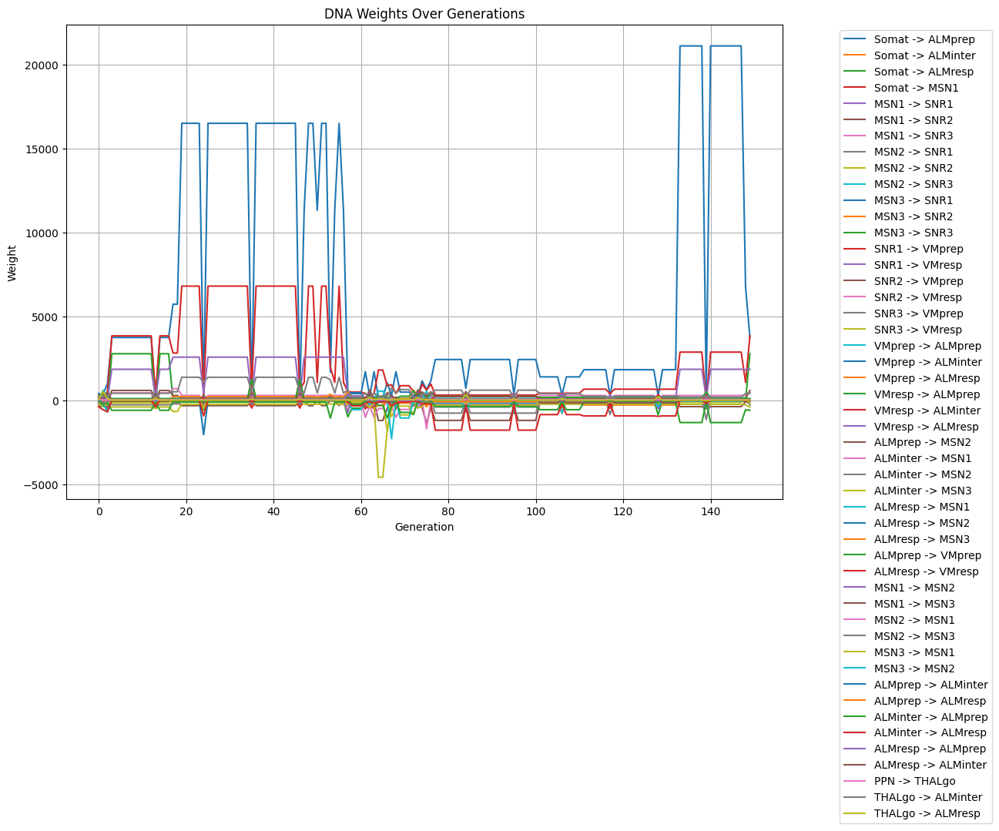

In [35]:
import matplotlib.pyplot as plt

def plot_dna_weights_over_generations(ga_results, active_synapses):
    # Create a dictionary to store weights for each connection over generations
    weights_over_generations = {f"{pair[0]} -> {pair[1]}": [] for pair in active_synapses}
    
    # Iterate over each generation
    for gen in sorted(ga_results['generation'].unique()):
        # Get the best DNA for the current generation
        best_dna = ga_results[ga_results['generation'] == gen].iloc[0]['dna']
        
        # Store the weights for each connection
        for i, weight in enumerate(best_dna):
            connection_label = f"{active_synapses[i][0]} -> {active_synapses[i][1]}"
            weights_over_generations[connection_label].append(weight)
    
    # Plot the weights over generations
    plt.figure(figsize=(12, 8))
    for connection, weights in weights_over_generations.items():
        plt.plot(range(len(weights)), weights, label=connection)
    
    plt.title('DNA Weights Over Generations')
    plt.xlabel('Generation')
    plt.ylabel('Weight')
    plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1))
    plt.grid(True)
    plt.show()

# Call the function with the ga_results DataFrame and ACTIVE_SYNAPSES list
plot_dna_weights_over_generations(ga_results, ACTIVE_SYNAPSES)